In [1]:
using Plots
gr(fmt = :png)
using Statistics

In [2]:
f(x,x0) = atan(x+x0)

f (generic function with 1 method)

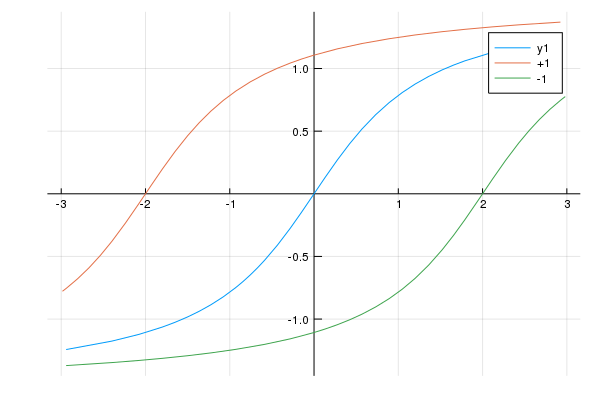

In [3]:
plot(x->f(x,0), -3, 3, frame=:origin)
plot!(x->f(x,2),  -3, 3, lab="+1")
plot!(x->f(x,-2), -3, 3, lab="-1")

### Analytical derivative
Cervanly not a good estimation of the errors

In [4]:
df(x,x0) = 1/((x+x0)^2+1)

df (generic function with 1 method)

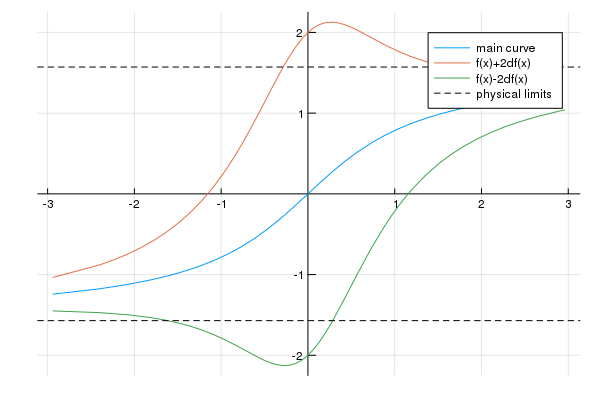

In [5]:
plot(x->f(x,0), -3, 3, frame=:origin, lab="main curve")
plot!([x->f(x,0) + 2df(x,0),
       x->f(x,0) - 2df(x,0)], -3, 3, lab=["f(x)+2df(x)" "f(x)-2df(x)"])
hline!([-π/2, π/2], l=(:black,:dash), lab="physical limits")

### Numerical calculation of Quantiles

In [6]:
# x0 is randomly distributed
ff(x) = [f(x,x0) for x0 in 2 .* randn(1000)]

ff (generic function with 1 method)

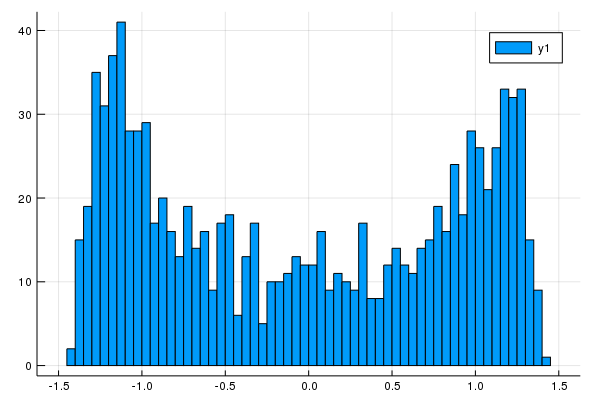

In [7]:
histogram(ff(0), bins=100)

In [8]:
qf(x) = quantile(ff(x),[0.16,1-0.16])

qf (generic function with 1 method)

#### and comparison to $f(x\pm\sigma_{x_0})$

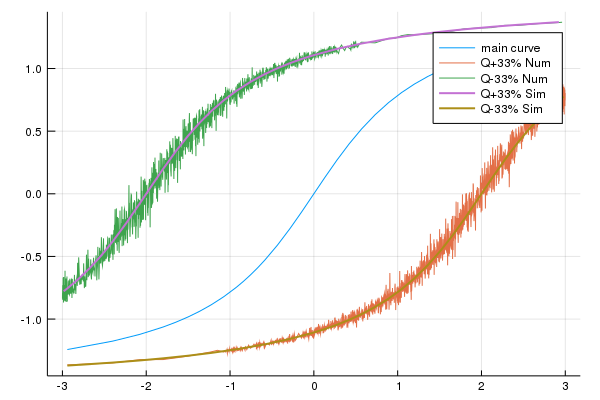

In [9]:
plot(x->f(x,0),-3,3, lab="main curve")
plot!(x->qf(x)[1],-3,3, lab="Q+33% Num")
plot!(x->qf(x)[2],-3,3, lab="Q-33% Num")
plot!(x->f(x+2,0),-3,3, lab="Q+33% Sim", lw=2)
plot!(x->f(x-2,0),-3,3, lab="Q-33% Sim", lw=2)

### Analytical calculation of the distributions

#### Question is: given density function $\rho_x$ calculate density function $\rho_{\arctan(x)}$
$$
y(x) = \arctan(x),\quad x = \tan(y)
$$
Density function is derivative of cumulative function $\rho_y = F_y'$
$$
F_y = \int_{-\infty}^{x<x(y)} \rho_x(x)\,\mathrm{d}x
$$
The defivative reads:
$$
\rho_y(y) = \rho_x(x(y))\,x'(y) \to \rho_x(\tan(y))\,/\, \cos^2 y
$$


In [10]:
h(y,x) = let σx0 = 2
    1/(sqrt(2π)*σx0)*exp(-(tan(y)-x)^2/(2*σx0^2))/cos(y)^2
end

h (generic function with 1 method)

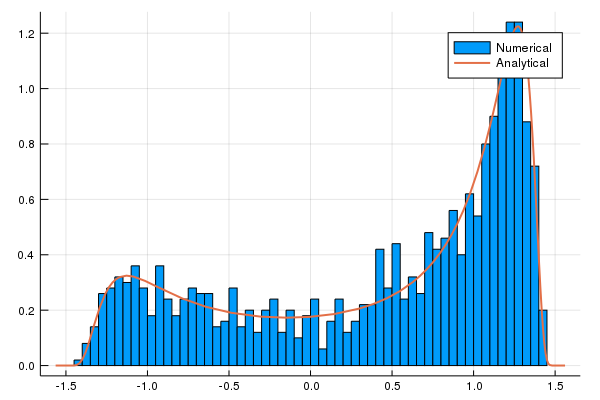

In [14]:
histogram(ff(1), bins=100, norm=true, lab="Numerical")
let x = 1
    plot!(y->h(y,x), -π/2, π/2, lw=2, lab="Analytical")
end

In [12]:
using Interact

HTML{String}("    <script class='js-collapse-script'>\n        var curMatch =\n            window.location.href\n            .match(/(.*?)\\/notebooks\\/.*\\.ipynb/);\n\n        curMatch = curMatch ||\n            window.location.href\n            .match(/(.*?)\\/apps\\/.*\\.ipynb/);\n\n        if ( curMatch ) {\n            \$('head').append('<base href=\"' + curMatch[1] + '/\">');\n        }\n    </script>\n")

HTML{String}("<script class='js-collapse-script' src='/assetserver/6b1165e6fe6b905e061701f91f7c8ed174b63f31-assets/webio/dist/bundle.js'></script>")

HTML{String}("<script class='js-collapse-script' src='/assetserver/6b1165e6fe6b905e061701f91f7c8ed174b63f31-assets/providers/ijulia_setup.js'></script>")

HTML{String}("  <script class='js-collapse-script'>\n    \$('.js-collapse-script').parent('.output_subarea').css('padding', '0');\n  </script>\n")

Widget{:manipulate,Any}(OrderedDict{Symbol,Any}(:x=>Widget{:slider,Float64}(OrderedDict{Symbol,Any}(:changes=>Observable{Int64}("ob_05", 0, Any[SyncCallback(Scope("knockout-component-b3bb1b7f-12b1-4fd9-bed1-ab7127ba4bf2", Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :label), Any["x"], Dict{Symbol,Any}(:className=>"interact ",:style=>Dict{Any,Any}(:padding=>"5px 10px 0px 10px")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"text-align:right;width:18%")), 2), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :input), Any[], Dict{Symbol,Any}(:max=>61,:min=>1,:attributes=>Dict{Any,Any}(:type=>"range",Symbol("data-bind")=>"numericValue: index, valueUpdate: 'input', event: {change : function () {this.changes(this.changes()+1)}}","orient"=>"horizontal"),:step=>1,:className=>"slider slider is-fullwidth",:style=>Dict{Any,Any}()), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"flex-grow:1; margin: 0 2%")), 1), Node{DOM}(DOM(:html, :div), Any[Node{DOM}(DOM(:html, :p), Any[], Dict{Symbol,Any}(:attributes=>Dict("data-bind"=>"text: formatted_value")), 0)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"width:18%")), 1)], Dict{Symbol,Any}(:attributes=>Dict("style"=>"display:flex; justify-content:center; align-items:center;")), 7), Dict{String,Tuple{Observables.AbstractObservable,Union{Nothing, Bool}}}("formatted_vals"=>(Observable{Any}("ob_03", ["-3.0", "-2.9", "-2.8", "-2.7", "-2.6", "-2.5", "-2.4", "-2.3", "-2.2", "-2.1"  …  "2.1", "2.2", "2.3", "2.4", "2.5", "2.6", "2.7", "2.8", "2.9", "3.0"], Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "formatted_vals")))]), nothing),"changes"=>(Observable{Int64}(#= circular reference @-6 =#), nothing),"formatted_value"=>(Observable{String}("ob_04", "0.0", Any[SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "formatted_value")))]), nothing),"index"=>(Observable{Any}("ob_02", 31, Any[##25#28{##70#73,Observable{Float64},Array{Function,1}}(##70#73(Box(-3.0:0.1:3.0)), Observable{Float64}("ob_01", 0.0, Any[##24#27{##68#71,Observable{Any},Array{Function,1}}(##68#71(Box(-3.0:0.1:3.0)), Observable{Any}(#= circular reference @-6 =#), Function[##24#27{##68#71,Observable{Any},Array{Function,1}}(#= circular reference @-2 =#), ##25#28{##70#73,Observable{Float64},Array{Function,1}}(#= circular reference @-5 =#)]), #g#15{##16#17{##29#32,Observable{Any}},Tuple{Observable{Float64}}}(##16#17{##29#32,Observable{Any}}(##29#32(), Observable{Any}("ob_06", Plot{Plots.GRBackend() n=1}, Any[])), (Observable{Float64}(#= circular reference @-4 =#),))]), Function[##24#27{##68#71,Observable{Any},Array{Function,1}}(##68#71(Box(-3.0:0.1:3.0)), Observable{Any}(#= circular reference @-5 =#), Function[#= circular reference @-2 =#]), ##25#28{##70#73,Observable{Float64},Array{Function,1}}(#= circular reference @-2 =#)]), SyncCallback(Scope(#= circular reference @-6 =#), SyncCallback(Scope(#= circular reference @-7 =#), ##40#42{Scope,String}(Scope(#= circular reference @-8 =#), "index")))]), nothing)), Set(String[]), nothing, Any["knockout"=>"/localhome/mikhasenko/.julia/packages/Knockout/JIqpG/src/../assets/knockout.js", "knockout_punches"=>"/localhome/mikhasenko/.julia/packages/Knockout/JIqpG/src/../assets/knockout_punches.js", "/localhome/mikhasenko/.julia/packages/InteractBase/Q4IkI/src/../assets/all.js", "/localhome/mikhasenko/.julia/packages/InteractBase/Q4IkI/src/../assets/style.css", "/localhome/mikhasenko/.julia/packages/InteractBulma/Ohu5Y/src/../assets/main.css"], Dict{Any,Any}("formatted_vals"=>Any[JSString("(function (val){return (val!=this.model[\"formatted_vals\"]()) ? (this.valueFromJulia[\"formatted_vals\"]=true, this.model[\"formatted_vals\"](val)) : undefined})")],"_promises"=>Dict{Any,Any}("importsLoaded"=>Any[JSString("function (ko, koPunches) {\n
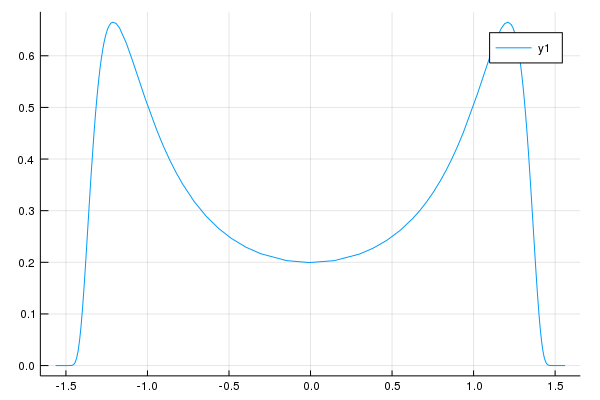
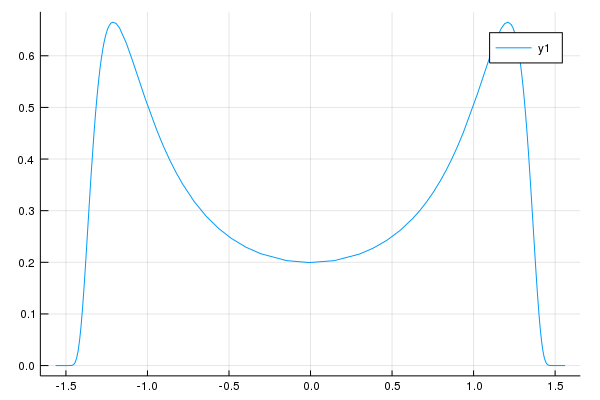

In [13]:
@manipulate for x = -3:0.1:3
    plot(y->h(y,x), -π/2, π/2)
end